In [1]:
!pip install -Uqq fastai duckduckgo_search

     |████████████████████████████████| 96 kB 7.6 MB/s 
     |████████████████████████████████| 62 kB 1.9 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.1.3 which is incompatible.


In [3]:
from duckduckgo_search import ddg_images
from fastcore.all import *
def search_images(item,max_no=60):
    print(f"searching for {item}")
    return L(ddg_images(item,max_results = max_no)).itemgot('image')
from fastai.vision.all import *
from time import sleep
import os

In [4]:
sport = "Cricket","American football","Football","Baseball","Formula 1"
path = Path("wat_sport")
for i in sport:
  dest = path/i
  dest.mkdir(exist_ok = True, parents = True)
  download_images(dest, urls = search_images(f"{i} match"))
  sleep(10)
  resize_images(path/i, max_size = 400, dest = path/i)


searching for Cricket match
searching for American football match
searching for Football match
searching for Baseball match
searching for Formula 1 match


In [5]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

8

In [6]:
acs = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2, seed = 42),
    get_y = parent_label,
    item_tfms = Resize(224),
    batch_tfms = aug_transforms()
    )
dls = acs.dataloaders(path)

In [7]:
learn = vision_learner(dls, resnet50, metrics = error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,2.303335,1.623242,0.415094,00:06


epoch,train_loss,valid_loss,error_rate,time
0,0.955692,0.923186,0.283019,00:03
1,0.654050,0.423022,0.150943,00:02
2,0.507370,0.366090,0.150943,00:03
3,0.414579,0.342013,0.132075,00:02


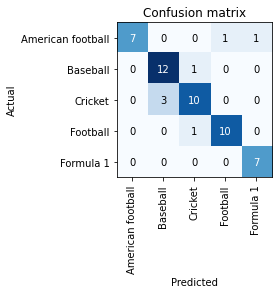

In [8]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [9]:
from fastai.vision.widgets import *

In [10]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [11]:
for idx in cleaner.delete():
  cleaner.fns[idx].unlink()
for idx,cat in cleaner.change():
  shutil.move(str(cleaner.fns[idx]), path/cat)

In [15]:
learn.export()

In [12]:
from fastdownload import download_url

In [17]:
cricket = "football.jpg"
download_url(search_images('football match', max_no=1)[0], 'football.jpg', show_progress=False)


searching for football match


Path('football.jpg')

In [18]:
learn_inf = load_learner('export.pkl')
learn_inf.predict(cricket)

('Football',
 TensorBase(3),
 TensorBase([5.5775e-05, 1.3854e-05, 1.6865e-05, 9.9991e-01, 4.5874e-06]))